## FDR4ALT Project Radar Altimeter Product Version 01 Tutorials - ERS-2

This tutorial mainly intends for FDR4ALT Project Radar Altimeter Product Version 01 datasets processing, more specifically, which is ERS-2 satellite. In abovementioned tutorials, we have introduced Topex/Poseidon Level1B Sensor Data Record and FDR4ALT Project ERS-1 Altimeter Product processing and their applications in inland water level estimation. Similarly, this tutorial shows how to process FDR4ALT Project TDP IW (inland water) Product - ERS-2 in High Mountain Asia (HMA).

NOTE: This tutorial is only for personal interest and usage since ESA has decided to continue with the FDR4ALT project for 3 additional years and prepare a second version of the FDR4ALT products in the future.

Before we start to process FDR4ALT Project TDP IW Product - ERS-2, we need to import some necessary packages...

In [25]:
import os
from glob import *
import shutil
import numpy as np
import numpy.typing as npt
import pandas as pd
import geopandas as gpd
import netCDF4 as nc
from scipy.stats import linregress
import cv2
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.gridspec as gridspec
import cartopy
import cartopy.crs as ccrs
import cartopy.io as io
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LATITUDE_FORMATTER, LONGITUDE_FORMATTER

Now, let's read and retrieve all "*.nc" files in one specific year during ERS-2 operation period (1995-2003).

In [7]:
def fdr_preprocess(inDir: str) -> None:
    '''
    Preprocess FDR4ALT IW product, mainly includes move "*.nc.zip" files and unzip them

    @param:
    inDir: input directory containing associated files

    return: preprocessed files
    '''
    if not os.path.exists(inDir):
        raise FileNotFoundError(inDir, "directory does not exist.")
    
    ## Move "*.nc.zip" file into root directory
    zipStack = glob(inDir + "*/*.zip")
    if len(zipStack) == 0:
        raise ValueError(inDir + "subdirectory does not contain zip files.")
    for zip in zipStack:
        zip = os.path.normpath(zip)
        shutil.move(src = zip, dst = inDir)
    print(inDir, "zip file movement finished.")

    ## Unzip "*.nc.zip" files
    zipStack = glob(inDir + "*.zip")
    for zip in zipStack:
        zip = os.path.normpath(zip)
        shutil.unpack_archive(filename = zip, extract_dir = inDir, format = "zip")
    print(inDir, len(zipStack), "zip files unzipped.")

    return None

## Directory and File Path
ersFdrDir = "E:/GL/South_Lhonak/FDR4ALT/IW/ERS_2/"
hmaPath = "E:/GL/South_Lhonak/vector/hma_gtng_202307.geojson"
hmaMergePath = "E:/GL/South_Lhonak/vector/hma_dissolve.geojson"

yrList = ['1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003']

for yr in yrList:
    srcDir = ersFdrDir + yr + "/"
    fdr_preprocess(inDir = srcDir)

for yr in yrList:
    srcDir = ersFdrDir + yr + "/"
    ncStack = glob(srcDir + "*.nc")
    print(yr, len(ncStack))

1995 6209
1996 9947
1997 9884
1998 9912
1999 9815
2000 9464
2001 9201
2002 9785
2003 4676


We can see that there are 6209, 9947, 9884, 9912, 9815, 9464, 9201, 9785, and 4676 files from 1995 to 2003. All the files we have unzipped and next we read and retrieve altitudes of each "*.nc" file...

In [ ]:
def fdr_read(ncDir: str, field: list) -> dict:
    '''
    Read FDR products in a directory and return info as a dictionary

    @params:
    ncDir: input FDR products "*.nc" files in a directory
    field: variable names contained in the product

    return: retrieved info returned as a dictionary
    '''
    ncStack = glob(ncDir + "*.nc")

    if len(ncStack) == 0:
        raise FileNotFoundError(ncDir, "does not contain *.nc files.")
    if len(field) == 0:
        raise ValueError("input field", field, "is empty.")
    
    result = {}
    for idx, ncPath in enumerate(ncStack):
        ncPath = os.path.normpath(ncPath)
        
        fieldArr = np.char.array(list(nc.Dataset(ncPath).variables.keys()))  # set 'time' variable as original fieldArr
        if len(nc.Dataset(ncPath).groups) > 0:
            for group in nc.Dataset(ncPath).groups:
                varsList = [group + "/" + key for key in nc.Dataset(ncPath).groups[group].variables.keys()]
                fieldArr = np.append(fieldArr, varsList)

        if idx == 0:
            if len(field) == 1:
                if not np.any(field[0] == fieldArr):
                    raise ValueError("'" + field[0] + "'" + " field is not listed in " + ncPath)
                
                with nc.Dataset(ncPath, 'r') as ds:
                    if '/' in field[0]:
                        result[field[0].split('/')[1]] = ds[field[0]][:].data
                    else:
                        result[field[0]] = ds[field[0]][:].data
            else:
                with nc.Dataset(ncPath, 'r') as ds:
                    for elem in field:
                        if not np.any(elem == fieldArr):
                            raise ValueError("'" + elem + "'" + " field is not listed in " + ncPath)
                        if '/' in elem:
                            result[elem.split('/')[1]] = ds[elem][:].data
                        else:
                            result[elem] = ds[elem][:].data
        else:
            if len(field) == 1:
                if not np.any(field[0] == fieldArr):
                    raise ValueError("'" + field[0] + "'" + " field is not listed in " + ncPath)
                
                with nc.Dataset(ncPath, 'r') as ds:
                    if '/' in field[0]:
                        result[field[0].split('/')[1]] = np.append(result[field[0].split('/')[1]], ds[field[0]][:].data)
                    else:
                        result[field[0]] = np.append(result[field[0]], ds[field[0]][:].data)
            else:
                with nc.Dataset(ncPath, 'r') as ds:
                    for elem in field:
                        if not np.any(elem == fieldArr):
                            raise ValueError("'" + elem + "'" + " field is not listed in " + ncPath)
                        if '/' in elem:
                            result[elem.split('/')[1]] = np.append(result[elem.split('/')[1]], ds[elem][:].data)
                        else:
                            result[elem] = np.append(result[elem], ds[elem][:].data)
    
    return result

fieldList = ['time', 'main/latitude', 'main/longitude', 'main/wsh_above_ellipsoid', 'main/wsh_uncertainty', 'main/wsh_quality_flag', 'main/geoid', 'main/surface_type', \
             'main/land_water_occurrence', 'expert/altitude', 'expert/range_ice1', 'expert/range_ice3', 'expert/range_mle4', 'expert/range_tfmra', 'expert/sigma0_ice1', \
             'expert/sigma0_ice3', 'expert/sigma0_mle4', 'expert/sigma0_tfmra', 'expert/wet_tropospheric_correction', 'expert/dry_tropospheric_correction', \
             'expert/ionospheric_correction', 'expert/solid_earth_correction', 'expert/pole_tide_correction', 'expert/waveform_class']

yrList = ['1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003']
iwList = yrList
for idx, yr in enumerate(yrList):
    iwList[idx] = fdr_read(ncDir = ersFdrDir + yr + "/", field = fieldList)
iwList

Now, we have acquired all footprints of ERS-2 radar altimeter globally and save them in a list, but some of them are invalid based on field "wsh_above_ellipsoid" and "wsh_uncertainty". Still, we still have some further processing of footprints, such as longitude normalization, format transformation, etc. All of this needs us to write a function to pack all these procedures... 

In [ ]:
def fdr_process(inDic: dict, timeStart: str, wshInvalidValue: float, wshUncInvlidValue: int, longitudeTrans = True) -> pd.DataFrame:
    '''
    FDR IW product processing, including dropping invalid footprints and longitude normalization.

    @params:
    inDic: input dictionary containing retrieved "*.nc" info
    timeStart: start UTC time of "*.nc" file
    wshInvalidValue: invalid value of "wsh_above_ellipsoid" field in FDR IW product
    wshUncInvalidValue: invalid value of "wsh_uncertainty" field in FDR IW product
    longitudeTrans: whether to apply longitude normalization

    return: processed FDR IW product
    '''
    if not isinstance(inDic, dict):
        raise TypeError(inDic, "is not dictionary type.")
    if not isinstance(timeStart, str):
        raise TypeError(timeStart, "is not string type.")
    if not isinstance(wshInvalidValue, float):
        raise TypeError(wshInvalidValue, "is not float type.")
    if not isinstance(wshUncInvlidValue, int):
        raise TypeError(wshUncInvlidValue, "is not integer type.")
    
    ## time conversion
    timeStart = np.datetime64(timeStart)
    inDic['time'] = (timeStart + np.timedelta64(1, 'D') * inDic['time'].astype(np.float64)).astype(str)

    ## dictionary to data frame
    inDf = pd.DataFrame.from_dict(data = inDic)

    ## longitude normalization
    if longitudeTrans:
        inDf.loc[inDf['longitude'] > 180, 'longitude'] = inDf[inDf['longitude'] > 180]['longitude'] - 360

    ## index of invalid value described in field "wsh_above_ellipsoid"
    idxWshDrop = list(inDf[(inDf['wsh_above_ellipsoid'] < -250) | (inDf['wsh_above_ellipsoid'] > 8000) | (np.isclose(inDf['wsh_above_ellipsoid'], 9.969209968386869e+36))].index)

    ## index of invalid value described in field "wsh_uncertainty"
    idxWshUncDrop = list(inDf[np.isclose(inDf['wsh_uncertainty'], 2147483647)].index)

    idxDrop = idxWshDrop + idxWshUncDrop
    inDf.drop(idxDrop, inplace = True)
    print(len(idxDrop), "rows dropped.")

    return inDf

for idx, dic in enumerate(iwList):
    iwList[idx] = fdr_process(inDic = dic, timeStart = '1990-01-01T00:00:00.000000', wshInvalidValue = 9.969209968386869e+36, wshUncInvlidValue = 2147483647, longitudeTrans = True)
iwList

We can see that there are millions of footprints are invalid of each year! This warns us that we need to drop invalid rows before further analysis when utilising FDR4ALT IW product. Now we want to see how many footprints remained after filtering...

In [9]:
iwList[0].shape, iwList[1].shape, iwList[2].shape, iwList[3].shape, iwList[4].shape, iwList[5].shape, iwList[6].shape, iwList[7].shape, iwList[8].shape

((1444179, 24),
 (2286459, 24),
 (2287042, 24),
 (2298302, 24),
 (2266502, 24),
 (2172465, 24),
 (2037167, 24),
 (2253853, 24),
 (882095, 24))

Not bad at all! We still have millions of footprints kept after filtering globally, we guess, which is adequate enough for further analysis. Let's plot locations of footprints of each year... 

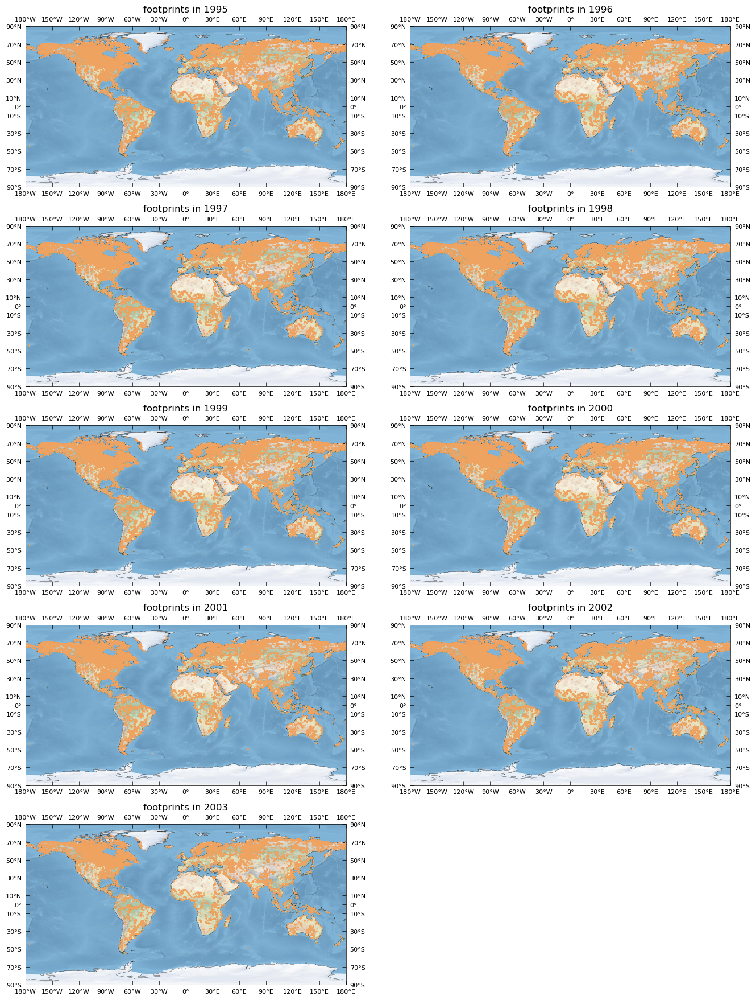

In [14]:
def fdr_plot_globe(inList: list, rows: int, cols: int, yrList: list) -> None:
    '''
    Plot footprints distribution of each year globally

    @params:
    inList: list containing footprints info of each year in format of data frame
    rows: how many subfigures in row wise
    cols: how many subfigures in column wise
    yrList: year name of each subfigure

    return: a figure with rows*cols subfigures, representing footprints dispersion of each year
    '''
    if not isinstance(inList, list):
        raise TypeError(inList, "is not list type.")
    if not isinstance(rows, int):
        raise TypeError(rows, "is not integer type.")
    if not isinstance(cols, int):
        raise TypeError(cols, "is not integer type.")
    if not isinstance(yrList, list):
        raise TypeError(yrList, "is not list type.")
    
    fig = plt.figure(figsize = (16, 22))
    crs = ccrs.PlateCarree()
    for idx, elem in enumerate(inList):
        idx += 1
        ax = fig.add_subplot(rows, cols, idx, projection = crs)
        ax.plot(elem['longitude'], elem['latitude'], 'o', color = 'sandybrown', markersize = 0.1)
        ax.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
        ax.yaxis.set_major_formatter(LATITUDE_FORMATTER)
        ax.set_xticks([-180, -150, -120, -90, -60, -30, 0, 30, 60, 90, 120, 150, 180])
        ax.set_yticks([-90, -70, -50, -30, -10, 0, 10, 30, 50, 70, 90])
        ax.tick_params(axis = 'both', which = 'major', labelsize = 8, direction = 'in', length = 5, width = 0.5, pad = 5, top = True, right = True, labeltop = True, labelright = True)
        ax.spines['geo'].set_linewidth(0.5)

        ax.add_feature(cfeature.LAND)
        ax.add_feature(cfeature.COASTLINE, lw = 0.25)
        ax.add_feature(cfeature.RIVERS, lw = 0.25)
        ax.add_feature(cfeature.LAKES)
        ax.add_feature(cfeature.OCEAN)
        ax.stock_img()

        # ax.set_extent((66.5, 105, 26, 47), crs)
        ax.set_extent((-180, 180, -90, 90), crs)
        ax.set_title("footprints in " + str(yrList[idx - 1]))

    plt.show()

    return None

# yrList = ['1995', '1996', '1997', '1998', '1999']
fdr_plot_globe(inList = iwList, rows = 5, cols = 2, yrList = yrList)

It's pretty clear that except Antarctic, all other continents are covered by footprints of ERS-2 radar altimeter more or less in above figure. And, we are still aware that there is a small, small number of footprints located in periphery of Greenland during 1995-2003. In vision, footprints are mainly concentrated in Eurasia and North America, which is a good news for us since our study area is HMA.

So, our next step is to figure out how footprints distribute in HMA and its subregions...

C:\Users\60202\AppData\Local\Temp\ipykernel_41204\1882694641.py:30: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.text(inGdf.centroid.x.tolist()[i] - 3, inGdf.centroid.y.tolist()[i], inGdf['full_name'][i], transform = crs, color = 'black', fontsize = 8, alpha = 0.8)
C:\Users\60202\AppData\Local\Temp\ipykernel_41204\1882694641.py:30: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.text(inGdf.centroid.x.tolist()[i] - 3, inGdf.centroid.y.tolist()[i], inGdf['full_name'][i], transform = crs, color = 'black', fontsize = 8, alpha = 0.8)
C:\Users\60202\AppData\Local\Temp\ipykernel_41204\1882694641.py:30: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_

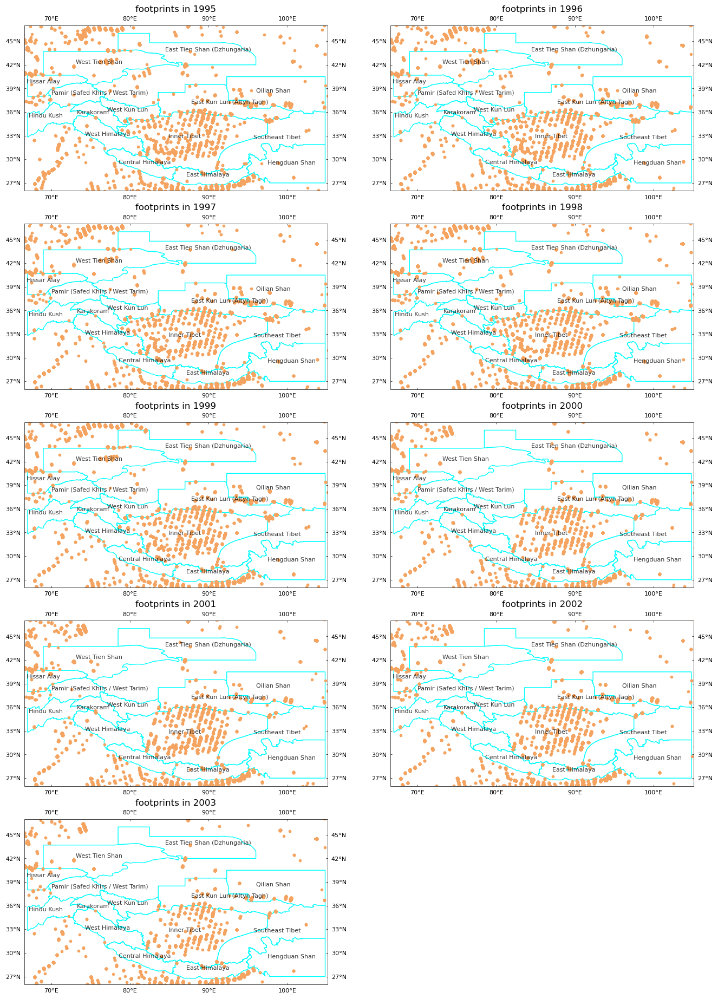

In [16]:
def fdr_plot_hma(inList: list, inGdf: gpd.GeoDataFrame, rows: int, cols: int, yrList: list) -> None:
    '''
    Plot footprints distribution of each year in HMA

    @params:
    inList: list containing footprints info of each year in format of data frame
    inGdf: HMA GeoDataFrame boundary
    rows: how many subfigures in row wise
    cols: how many subfigures in column wise
    yrList: year name of each subfigure

    return: a figure with rows*cols subfigures, representing footprints dispersion of each year
    '''
    if not isinstance(inList, list):
        raise TypeError(inList, "is not list type.")
    if not isinstance(rows, int):
        raise TypeError(rows, "is not integer type.")
    if not isinstance(cols, int):
        raise TypeError(cols, "is not integer type.")
    if not isinstance(yrList, list):
        raise TypeError(yrList, "is not list type.")
    
    fig = plt.figure(figsize = (16, 23))
    crs = ccrs.PlateCarree()
    for idx, elem in enumerate(inList):
        idx += 1
        ax = fig.add_subplot(rows, cols, idx, projection = crs)
        ax.add_geometries(inGdf['geometry'], crs = crs, facecolor = 'white', edgecolor = 'cyan')
        for i in range(inGdf.shape[0]):
            ax.text(inGdf.centroid.x.tolist()[i] - 3, inGdf.centroid.y.tolist()[i], inGdf['full_name'][i], transform = crs, color = 'black', fontsize = 8, alpha = 0.8)
        ax.plot(elem['longitude'], elem['latitude'], 'o', color = 'sandybrown', markersize = 3)
        ax.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
        ax.yaxis.set_major_formatter(LATITUDE_FORMATTER)
        ax.set_xticks([70, 80, 90, 100])
        ax.set_yticks([27, 30, 33, 36, 39, 42, 45])
        ax.tick_params(axis = 'both', which = 'major', labelsize = 8, direction = 'in', length = 2, width = 0.5, pad = 5, top = True, right = True, labeltop = True, labelright = True)
        ax.spines['geo'].set_linewidth(0.5)

        ax.set_extent((66.6, 105.1, 26, 47), crs)
        ax.set_title("footprints in " + str(yrList[idx - 1]))
    plt.show()

    return None

hmaGdf = gpd.read_file(hmaPath)
fdr_plot_hma(inList = iwList, inGdf = hmaGdf, rows = 5, cols = 2, yrList = yrList)

We can see that, in HMA, footprints mainly locate in Inner Tibet, where many lakes situated in its boundary. We now make a simple statistics about footprints of each subregion in each year during 1995-2003.

In [17]:
def footprints_count_within_region(fpGdf: str, regionGdf: str, subregionName: str) -> dict:
    '''
    Count footprints number in each subregion of input region file with GeoPandas within method.

    @params:
    fpGdf: input footprints file in the format of GeoDataFrame
    regionGdf: input region file in the format of GeoDataFrame
    subregionName: name of each subregion contained in region GeoDataFrame

    return: dictionary describing the number of footprints calculated within each subregion
    '''
    if not isinstance(fpGdf, gpd.GeoDataFrame):
        raise TypeError(fpGdf, "is not GeoDataFrame type.")
    if not isinstance(regionGdf, gpd.GeoDataFrame):
        raise TypeError(regionGdf, "is not GeoDataFrame type.")
    
    result = {}
    for idx in range(regionGdf.shape[0]):
        regionName = regionGdf.iloc[idx][subregionName][subregionName[0]]
        result[regionName] = np.count_nonzero(fpGdf.within(regionGdf.iloc[idx]['geometry']))
    
    return result

fpStatsDic = {}
## Convert dataframe into geodataframe firstly
for idx, elem in enumerate(iwList):
    elem = gpd.GeoDataFrame(elem, geometry = gpd.points_from_xy(elem['longitude'], elem['latitude']), crs = "EPSG:4326")
    fpStatsDic[idx] = footprints_count_within_region(fpGdf = elem, regionGdf = hmaGdf, subregionName = ['full_name'])
fpStatsDic

{0: {'Hissar Alay': 175,
  'Pamir (Safed Khirs / West Tarim)': 5,
  'West Tien Shan': 2306,
  'East Tien Shan (Dzhungaria)': 187,
  'West Kun Lun': 226,
  'East Kun Lun (Altyn Tagh)': 1338,
  'Qilian Shan': 2441,
  'Inner Tibet': 5383,
  'Southeast Tibet': 264,
  'Hindu Kush': 0,
  'Karakoram': 16,
  'West Himalaya': 321,
  'Central Himalaya': 1,
  'East Himalaya': 99,
  'Hengduan Shan': 35},
 1: {'Hissar Alay': 251,
  'Pamir (Safed Khirs / West Tarim)': 1,
  'West Tien Shan': 3411,
  'East Tien Shan (Dzhungaria)': 222,
  'West Kun Lun': 344,
  'East Kun Lun (Altyn Tagh)': 1953,
  'Qilian Shan': 3919,
  'Inner Tibet': 7876,
  'Southeast Tibet': 356,
  'Hindu Kush': 19,
  'Karakoram': 2,
  'West Himalaya': 488,
  'Central Himalaya': 3,
  'East Himalaya': 178,
  'Hengduan Shan': 44},
 2: {'Hissar Alay': 249,
  'Pamir (Safed Khirs / West Tarim)': 0,
  'West Tien Shan': 3387,
  'East Tien Shan (Dzhungaria)': 216,
  'West Kun Lun': 379,
  'East Kun Lun (Altyn Tagh)': 2361,
  'Qilian Shan': 

Now, we have computed footprints in each subregion of HMA of each year during 1995-2003. Next, we want to plot calculated statistics to make them clearer to see...

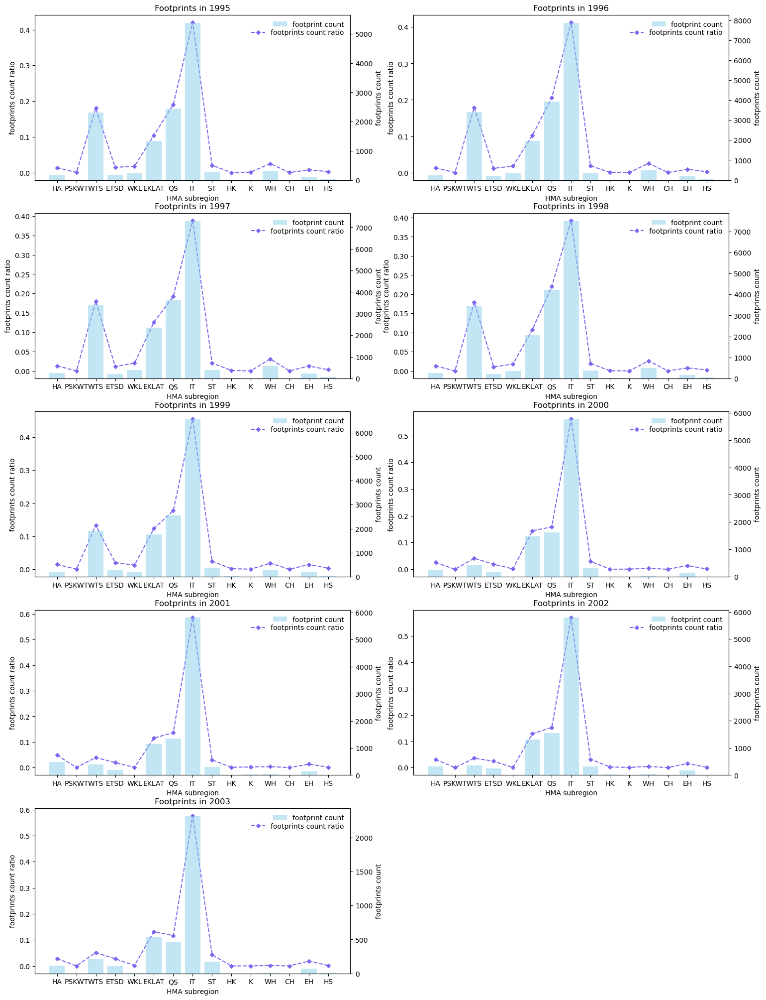

In [19]:
def region_name_rename(strArr: npt.ArrayLike) -> npt.ArrayLike:
    '''
    rename string for plotting

    @param:
    strArr: input str

    return renamed string array
    '''
    if strArr.shape[0] == 0:
        raise ValueError("input string is empty.")
    
    strArr = np.char.replace(np.char.replace(np.char.replace(strArr, '(', ''), ')', ''), '/ ', '')
    for idx in range(strArr.shape[0]):
        strArr[idx] = ''.join([char for char in strArr[idx] if char.isupper()])
        
    return strArr

rows, cols = 5, 2
fig, axes = plt.subplots(rows, cols, figsize = (18, 25))
fpKeys = region_name_rename(strArr = np.array(list(fpStatsDic[0].keys())))
for key in fpStatsDic:
    fpValues = np.array(list(fpStatsDic[key].values()))
    fpValsRatio = fpValues / np.sum(fpValues)

    axes[key // 2, key % 2].plot(fpKeys, fpValsRatio, 'D--', markersize = 4, color = 'mediumslateblue', label = "footprints count ratio")
    ax = axes[key // 2, key % 2].twinx()
    plt.bar(fpKeys, fpValues, alpha = 0.5, color = 'skyblue', label = 'footprint count')
    axes[key // 2, key % 2].set_xlabel('HMA subregion')
    axes[key // 2, key % 2].set_ylabel('footprints count ratio')
    ax.set_ylabel('footprints count')
    axes[key // 2, key % 2].set_title('Footprints in ' + str(yrList[key]))
    axes[key // 2, key % 2].legend(loc = 'upper right', frameon = False, bbox_to_anchor = (1, 0.95))
    ax.legend(loc = 'upper right', frameon = False)

plt.delaxes(axes[4, 1])
plt.show()

Here, it is more explicit that, in general, footprints dispersion is almost the same in each subregion of HMA at each year and it shows that Inner Tibet always occupies the largest proportion, values around 0.4, followed by Qilian Shan, West Tien Shan, and East Kun Lun (Altyn Tagh) subregion. Next, we start to plot footprints height and their locations in Google Earth software...

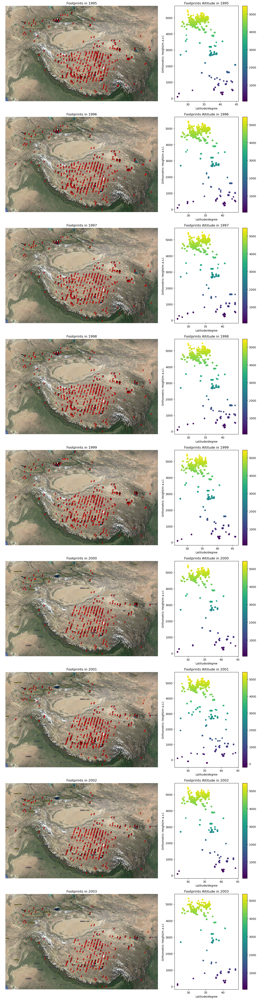

In [26]:
rows, cols = 9, 2
fig, axes = plt.subplots(rows, cols, figsize = (13, 50))
axes[0, 0].axis('off')
axes[0, 1].axis('off')
axes[1, 0].axis('off')
axes[1, 1].axis('off')
axes[2, 0].axis('off')
axes[2, 1].axis('off')
axes[3, 0].axis('off')
axes[3, 1].axis('off')
axes[4, 0].axis('off')
axes[4, 1].axis('off')
axes[5, 0].axis('off')
axes[5, 1].axis('off')
axes[6, 0].axis('off')
axes[6, 1].axis('off')
axes[7, 0].axis('off')
axes[7, 1].axis('off')
axes[8, 0].axis('off')
axes[8, 1].axis('off')

for idx, yr in enumerate(yrList):
    fpHMAArr = cv2.imread("D:/Downloads/FDR4ALT_ERS2_" + str(yr) + "_HMA.jpg", cv2.IMREAD_COLOR)[:, :, ::-1]
    fpHMAGpd = gpd.read_file("D:/Downloads/FDR4ALT_ERS2_" + str(yr) + "_HMA.geojson")
    wshHgtEGM2008 = fpHMAGpd['wsh_above_ellipsoid'] - fpHMAGpd['geoid']

    gs = gridspec.GridSpec(rows, cols, width_ratios = [1, 0.5])
    axes[idx, 0] = plt.subplot(gs[idx * 2])
    axes[idx, 1] = plt.subplot(gs[idx * 2 + 1])

    axes[idx, 0].axis('off')
    axes[idx, 0].imshow(fpHMAArr)
    axes[idx, 0].set_title("Footprints in " + str(yr))
    axHgtPlot = axes[idx, 1].scatter(fpHMAGpd['latitude'], wshHgtEGM2008, c = wshHgtEGM2008, s = 20, marker = 'o', cmap = 'viridis')
    axes[idx, 1].set_xlabel(xlabel = "Latitude/degree")
    axes[idx, 1].set_ylabel(ylabel = "Orthometric Height/m a.s.l.")
    axes[idx, 1].set_title("Footprints Altitude in " + str(yr))
    plt.colorbar(axHgtPlot, ax = axes[idx, 1])
    plt.tight_layout()

plt.show()

From above figure, we have seen how footprints distribute in HMA and their corresponding altitude ranges. In the next section, we start to estimate water surface height variations in selected region.

### Water Surface Height Variations

Based on former analysis, we find that Inner Tibet is the most wide lake-distribution region in HMA. So in this section, we start to choose Inner Tibet as an example to show how lake altitude varies during 1995-2003. Nonetheless, not all lakes located in Inner Tibet have been sensed by ERS-2 Radar Altimeter and even some lake contacted by radar echoes in one specific year, it may never be perceived by radar sensor in other years during 1995-2003. In this tutorial, we only focus on those lakes sensed by radar altimeter for every year with the number of footprints within lake boundary greater than 4. Lake boundary dataset utilized in this tutorial can be accessed from this website: https://zenodo.org/records/7016548. More details about this dataset can be seen from its publication: Pi et al. (2022) and its online content: https://www.nature.com/articles/s41467-022-33239-3#data-availability. In this dataset, it originally contain 11207 lakes, but according to our selection criteriaa, it only remain 43 lakes totally.

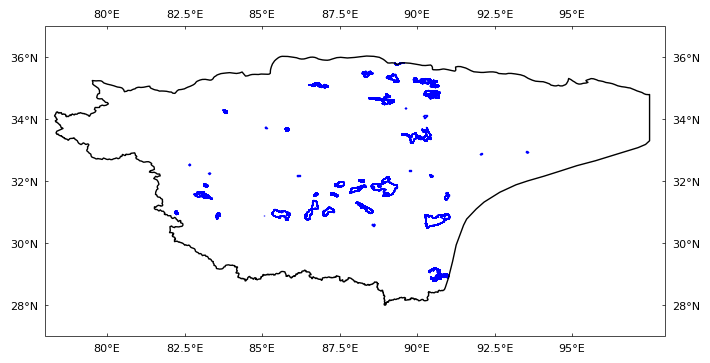

In [6]:
regionGdf = gpd.read_file("D:/Downloads/Inner_Tibet.geojson")
lakeGdf = gpd.read_file("D:/Downloads/fp_lakes.geojson")

fig = plt.figure(figsize = (8, 6))
crs = ccrs.PlateCarree()
ax = fig.add_subplot(1, 1, 1, projection = crs)
ax.add_geometries(lakeGdf['geometry'], crs = crs, facecolor = 'white', edgecolor = 'blue')
ax.add_geometries(regionGdf['geometry'], crs = crs, facecolor = 'none', edgecolor = 'black')
ax.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
ax.yaxis.set_major_formatter(LATITUDE_FORMATTER)
ax.set_xticks([80, 82.5, 85, 87.5, 90, 92.5, 95])
ax.set_yticks([28, 30, 32, 34, 36])
ax.tick_params(axis = 'both', which = 'major', labelsize = 8, direction = 'in', length = 2, width = 0.5, pad = 5, top = True, right = True, labeltop = True, labelright = True)
ax.spines['geo'].set_linewidth(0.5)

ax.set_extent((78, 98, 27, 37), crs)
plt.show()

Here is the spatial distribution of lakes in Inner Tibet, whose area is ranging from 2.99 km² to 2402.53 km². Now, we start to calculate lake water surface height variations during 1995-2003.

In [14]:
def wsh_estimation(fpPath: str, lakePath: str, attrName: str, colNames: list) -> pd.DataFrame:
    '''
    Estimate water surface height based on input footprints vector file and lake vector file

    @params:
    fpPath: input footprints vector file
    lakePath: input lake vector file
    attrName: unique attribute name in lake vector file

    return: water surface height estimation result for each lake in lake vector file
    '''
    if not os.path.exists(fpPath):
        raise FileNotFoundError(fpPath, "does not exist.")
    if not os.path.exists(lakePath):
        raise FileNotFoundError(lakePath, "does not exist.")
    
    ## Read footprint and lake vector files
    fpGdf = gpd.read_file(fpPath)
    lakeGdf = gpd.read_file(lakePath)
    if sum([attrName == colName for colName in lakeGdf.columns]) == 0:
        raise ValueError(attrName, "does not listed in", lakePath)
    
    ## Estimate water surface height
    dicResult = {}
    for idx in range(lakeGdf.shape[0]):
        id = lakeGdf.iloc[idx][attrName]
        fpIdx = fpGdf.within(lakeGdf.iloc[idx]['geometry'])[fpGdf.within(lakeGdf.iloc[idx]['geometry'])].index.values
        latitude = fpGdf.iloc[fpIdx]['latitude'].values
        wshArr = (fpGdf.iloc[fpIdx]['wsh_above_ellipsoid'] - fpGdf.iloc[fpIdx]['geoid']).values
        idxArr = abs(wshArr - np.mean(wshArr)) < 3 * np.std(wshArr)
        latitude, wshArr = latitude[idxArr], wshArr[idxArr]
        slope, intercept = np.polyfit(latitude, wshArr, 1)
        wsh = slope * np.mean(latitude) + intercept
        dicResult[str(id)] = [wsh, fpGdf.iloc[fpIdx]['wsh_uncertainty'].mean()]
    
    dfResult = pd.DataFrame(dicResult.items(), columns = colNames)

    return dfResult

lakePath = "D:/Downloads/fp_lakes.geojson"

fpDir = "D:/Downloads/DEM_Products/fp/"
yrList = ['1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003']
for yr in yrList:
    fpPath = fpDir + "FDR4ALT_ERS2_" + yr + "_HMA.geojson"
    wshDf = wsh_estimation(fpPath = fpPath, lakePath = lakePath, attrName = 'Lake_id', colNames = ['ID', yr])
    if yr == '1995':
        resultDf = wshDf
    else:
        resultDf = pd.concat([resultDf, wshDf[yr]], axis = 1, join = 'inner')
resultDf

,ID,1995,1996,1997,1998,1999,2000,2001,2002,2003
0,85,"[4533.610290763573, 7.8745473684210525]","[4533.889482055749, 7.958270588235294]","[4534.222675463465, 7.9265608465608475]","[4534.273172893766, 7.425924895688456]","[4534.556882490829, 7.955044247787611]","[4535.73958040023, 7.712366863905324]","[4536.780709485415, 7.475724533715925]","[4538.154335770018, 6.9808]","[4538.481130612022, 6.839467787114844]"
1,102,"[4719.357169147337, 6.5280695652173915]","[4719.704388731472, 6.612040816326531]","[4719.9129890003815, 6.565061511423551]","[4720.156888567414, 6.629619482496195]","[4720.9264459731785, 6.997933070866142]","[4721.047654037083, 7.080133333333333]","[4721.511710286218, 6.886232142857143]","[4722.106098039658, 5.82994923857868]","[4721.98266808698, 6.036836158192091]"
2,180,"[4924.8848083629455, 6.076969696969697]","[4932.4129772384995, 7.123921568627449]","[4932.912963133652, 7.660000000000001]","[4931.878875641314, 6.976705882352941]","[4932.570328474758, 9.173636363636364]","[4931.93499665153, 7.652461538461538]","[4933.624324545588, 10.917543859649124]","[4932.279419225539, 6.363333333333333]","[4932.6591265102015, 6.036756756756756]"
3,185,"[4611.024291691398, -519093724.49685425]","[4611.282698235118, 6.872355212355212]","[4611.165134072952, 7.8693478260869565]","[4610.757115703068, 6.921785714285714]","[4610.8530952412275, 7.24178082191781]","[4611.317317682321, 7.001970802919708]","[4611.279415059257, 7.855534246575344]","[4611.740430845055, 6.794039408866995]","[4611.263357355016, 6.730135135135134]"
4,223,"[4532.27073416753, 7.486860254083485]","[4532.270370470267, 7.436305732484076]","[4532.201020502087, 7.169500000000001]","[4532.158284809175, 7.165666666666667]","[4532.749562022051, 7.857335025380711]","[4533.456315259345, 7.948968347010552]","[4533.80695093311, 8.0619477124183]","[4534.338589895711, 6.303394199785178]","[4534.180994926802, 6.592091254752851]"
5,278,"[4853.923273448295, 9.600945945945943]","[4854.493854011064, 9.5235807860262]","[4853.880897851467, 9.335840000000001]","[4853.812436705677, 7.75014598540146]","[4855.404618656738, 8.199936305732484]","[4854.882234654091, 7.6057216494845346]","[4854.16901807839, 9.043533333333334]","[4855.408332964981, 6.331666666666667]","[4855.847521299808, 6.76380165289256]"
6,322,"[4440.571541530525, 7.490625]","[4439.034670295757, 8.197272727272727]","[4438.693993395385, 10.489756097560976]","[4438.800293986937, 8.358245614035088]","[4439.177815670786, 8.434137931034481]","[4439.9497434285, 11.446562499999999]","[4440.456304155359, 11.02177777777778]","[4441.206230957405, 7.366]","[4440.649844708494, 5.809444444444445]"
7,346,"[4771.439673237463, 11.98]","[4772.207182463195, 11.147368421052633]","[4772.014456579958, 12.895999999999997]","[4773.24482189392, 13.245384615384616]","[4773.383537959234, 12.636363636363635]","[4772.68174314511, 9.439117647058826]","[4773.652646802557, 13.403]","[4772.292446506284, 12.362608695652172]","[4774.099169331905, 9.694166666666666]"
8,369,"[4714.326363770316, 8.339513274336282]","[4714.527193010494, 6.943690476190476]","[4714.188358846776, 8.9802]","[4714.202722052842, 8.274649122807018]","[4714.025485852143, 7.432489626556016]","[4714.66078658732, 7.857708333333332]","[4714.848266020369, 7.884868421052632]","[4714.681241159923, 6.989044117647059]","[4714.691901402675, 5.6778125]"
9,374,"[4815.395774693145, 6.983021978021977]","[4815.811342583173, 8.197102473498234]","[4815.7128366876805, 8.343037037037037]","[4816.057711932659, 7.62565693430657]","[4815.949985561443, 7.4146308724832215]","[4816.384640012735, 7.667563739376771]","[4816.243890661584, 7.0473333333333334]","[4816.76400122103, 6.3926720647773285]","[4816.970207566349, 6.1328571428571435]"


Now, we have acquired water surface height and its corresponding uncertainty of each lake at each year for full period (1995-2003). Next, we start to calculate water level trend of each lake and also to see its determination coefficient...

In [27]:
wshTrend = []
rSquare = []
pValue = []
for idx, row in resultDf.iterrows():
    slope, intercept, r, p, _ = linregress(np.array(yrList, dtype = np.int32), np.array(row.to_list()[1:])[:, 0])
    wshTrend.append(slope)
    rSquare.append(r ** 2)
    pValue.append(p)

trendDf = pd.DataFrame(list(zip(resultDf['ID'], wshTrend, rSquare, pValue)), columns = ['ID', 'wsh_trend', 'determination_coefficient', 'significance_value'])
trendDf

,ID,wsh_trend,determination_coefficient,significance_value
0,85,0.647673,0.904822,0.000080
1,102,0.363256,0.972179,0.000001
2,180,0.536257,0.318183,0.113647
3,185,0.051970,0.241858,0.178729
4,223,0.305927,0.864062,0.000285
5,278,0.201441,0.517000,0.029032
6,322,0.191699,0.318134,0.113681
7,346,0.226785,0.510902,0.030459
8,369,0.061703,0.354200,0.090899
9,374,0.175746,0.910037,0.000066


Okay, it is not bad, right? Almost half of lake with determination coeffcient > 0.5 with significance value < 0.01. The most crucial thing is that we find water level of 33 lakes in Inner Tibet is increasing, which accounts of ca. 77% of all the investigated lakes in this tutorial. Therefore, we have confidence that water surface height is increasing for most lakes situated in Inner Tibet during 1995-2003, which is generally in accord with previous researches (Zhang et al., 2020).

### Conclusions

In this tutorial, we have utilized FDR4ALT Project Radar Altimeter Product Version 01 ERS-2 datasets to monitor lake level variations in Inner Tibet, which is the most footprints-distributed subregion in HMA. Generally speaking, there are three main conclusions to draw:

1) With respect to the newly published FDR4ALT Project ERS-2 datasets, its application in inland water surface height monitoring proves to be convincing qualitatively. Due to the dearth of in-situ water level measurement, we cannot perform quantitative analysis, which should be expected in the future tutorial.

2) We select Inner Tibet as studied area and estimate water surface height variations of chosen 43 lakes in this region during 1995-2003. The result shows that ~77% lakes are experiencing increasing surface height, with increasing trend ranging from 0.16 m/yr to 0.65 m/yr (high confidence). Lakes surface height fluctuations with decreasing water level are not evident (generally < 0.10 m/yr), except two lakes with abnormal values, which is probably limited footprints been used for computation.

3) with long-term operation of ERS-2, results obtained in this tutorial is more compelling than last tutorial (ERS-1 Tutorial). In the future tutorial, we should combine different radar altimeter sensors together to uncover more confident conclusions. 